In [1]:
#general imports:
import warnings #to suppress grid search warnings
import numpy as np 
import pandas as pd
import lolopy.learners #allows easy uncertainty
import matplotlib.pyplot as plt
import seaborn as sns #heatmaps
import forestci as fci #confidence intervals for RFR - http://contrib.scikit-learn.org/forest-confidence-interval/index.html

#regression models:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression, ElasticNet, SGDRegressor, BayesianRidge
from sklearn.svm import SVR

#various ML tools:
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_predict, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, max_error
from skopt import BayesSearchCV #bayesian optimization

#imports custom libraries (shared functions)
import dependancies.shared_functions as sfn 
from dependancies.superlearner import get_superlearner as Superlearner

#try taking/ranking top ten features 

[MLENS] backend: threading


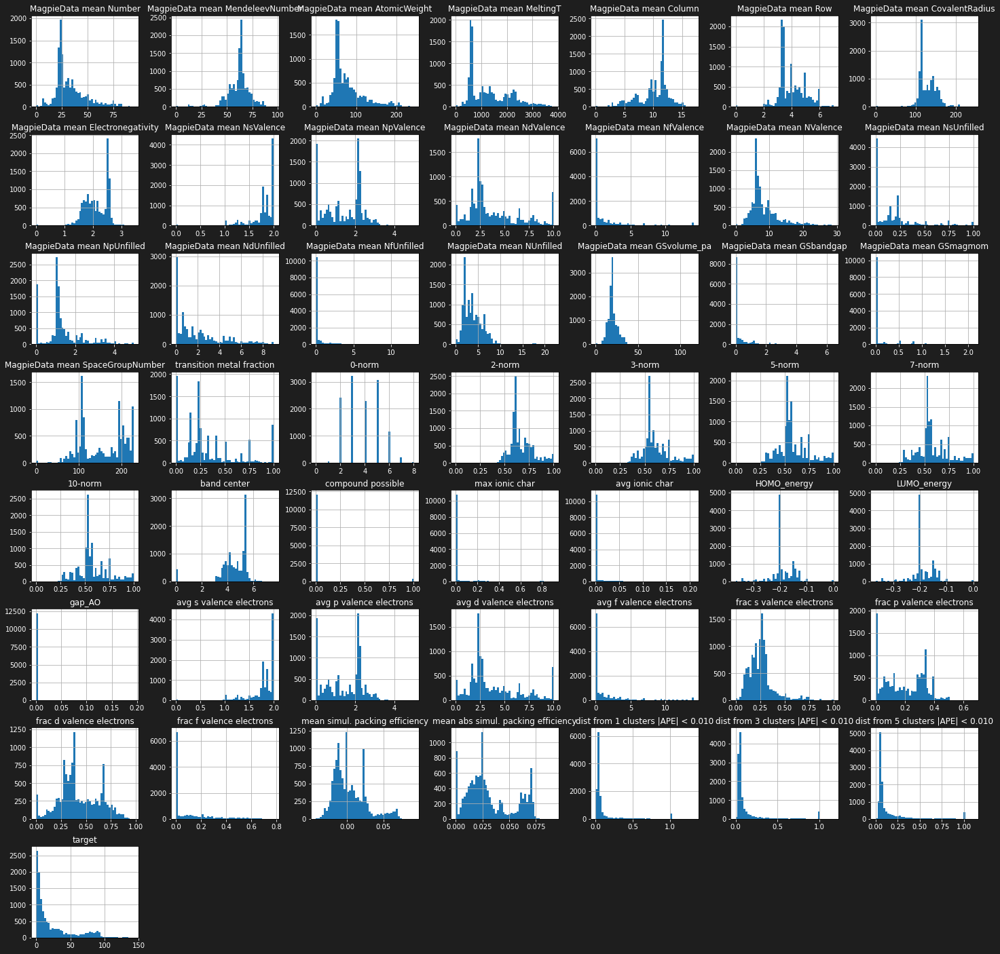

In [2]:
def analysis(): #makes a heatmap that shows correlations between features and targets, saves to '../data/feature_heatmap.png'
    global corr_matrix
    sfn.import_data(replace_inf=True) #import data with function above

    graph_data = pd.DataFrame(sfn.data) #make a new dataframe for the correlation matrix
    graph_data.drop(['HOMO_character','HOMO_element', 'LUMO_character', 'LUMO_element'], axis=1, inplace=True) #drop columns irrelevant to analysis
    graph_data['target'] = sfn.target.values #add target back in

    corr_matrix = graph_data.corr() #gets 2D correlation matrix
    fig, ax = plt.subplots(figsize=(36, 36), dpi = 480) #define figure and sizing features
    ax = sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap=sns.color_palette("Spectral", as_cmap=True))
    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)
    ax.tick_params(colors='grey', which='both') #set various colors

    #save heatmap
    figure = ax.get_figure()    
    figure.savefig('../data/feature_heatmap.png', dpi=480) #saves to '../data/feature_heatmap.png' at 480 dpi

    with plt.rc_context({'xtick.color':'white', 'ytick.color':'white','axes.titlecolor':'white','figure.facecolor':'#1e1e1e'}):
        graph_data.hist(bins=50, figsize=(25,25))
        plt.savefig("../data/feature_histogram.png")
        plt.show()
analysis() #calls function

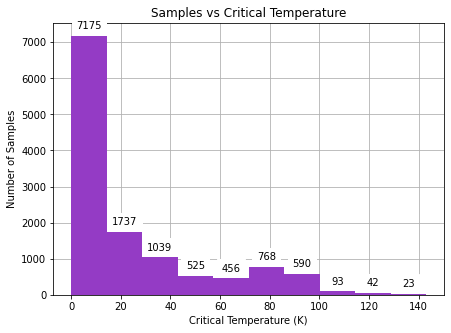

There are 6188 samples below 10K and 6210 samples above 10K. There are 159 samples above 100K and 0 samples above 260K.


In [10]:
def boxplot(export=True, background=True):
    sfn.import_data(replace_inf=True) #import data with function above
    graph_data = pd.DataFrame(sfn.data)
    boxplot = pd.DataFrame(sfn.target.values, columns=("Tc",))

    rc_context_dict = {'xtick.color':'white', 'ytick.color':'white','axes.titlecolor':'white','figure.facecolor':'#1e1e1e'} if background else {'figure.facecolor':'white'}
    title_color = 'white' if background else 'black' #define color for text in graph
    with plt.rc_context(rc_context_dict):
        fig, ax = plt.subplots(figsize=(7, 5))
        ax.hist(boxplot, color="#943bc5", bins=10, zorder=4) #create histogram

        for bar in ax.patches: #iterate through each bar of histogram
            height = bar.get_height() #get height of bar
            an = ax.annotate(f'{int(height)}', xy=(bar.get_x()+bar.get_width()/2, height), xytext=(0, 5), 
                                textcoords='offset points', ha='center', va='bottom', color='black', zorder=3) #add annotation over each bar
            an.set_bbox(dict(facecolor='white', pad=4.5, edgecolor='white')) #this sets a white background to the annotations so the grid doesn't make it hard to read

        ax.set_title("Samples vs Critical Temperature")
        ax.set_xlabel("Critical Temperature (K)", c=title_color)
        ax.set_ylabel("Number of Samples", c=title_color)
        ax.grid(zorder=0)
        if export:
            plt.savefig("../data/dataset_histogram.png")
        plt.show()

    below10 = (boxplot['Tc'] < 10).sum()
    above10 = (boxplot['Tc'] > 10).sum()
    above100 = (boxplot['Tc'] > 100).sum()
    above260 = (boxplot['Tc'] > 260).sum()
    print(f"There are {below10} samples below 10K and {above10} samples above 10K. There are {above100} samples above 100K and {above260} samples above 260K.")

boxplot(background=False, export=False) #calls function

Starting training on Random Forest - $T_C$ < 23K
('Random Forest - $T_C$ < 23K', 6.547, 1.585, 13.502, 0.796, 12.987)


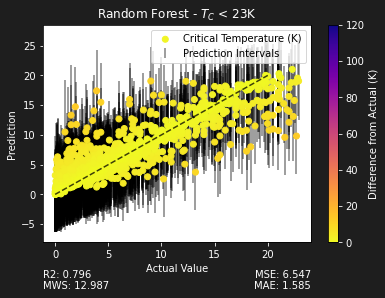

Starting training on Extra Trees - $T_C$ < 23K
('Extra Trees - $T_C$ < 23K', 6.161, 1.444, 17.286, 0.808, 12.676)


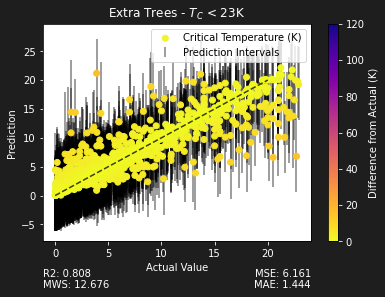

<Figure size 432x288 with 0 Axes>

In [5]:
cutoff = 23

sfn.import_data(replace_inf=True, split=False)
sfn.data = sfn.data[sfn.data.Tc < cutoff]
sfn.target = sfn.data.pop('Tc') #remove target (critical temp) from data
sfn.train_data, sfn.test_data, sfn.train_target, sfn.test_target = train_test_split(sfn.data, sfn.target, test_size=0.15, random_state=43, shuffle=True)

sfn.evaluate_one(f"Random Forest - $T_C$ < {cutoff}K", RandomForestRegressor, {'max_features': 'auto', 'n_estimators': 300}, uncertainty=True, method="plus", maxexpected=20, image=True)
sfn.evaluate_one(f"Extra Trees - $T_C$ < {cutoff}K", ExtraTreesRegressor, {'n_estimators': 589, 'n_jobs':-1}, uncertainty=True, method="plus", maxexpected=20, image=True)


Starting training on Random Forest - $T_C$ > 23K
('Random Forest - $T_C$ > 23K', 139.046, 7.859, 47.157, 0.807, 54.455)


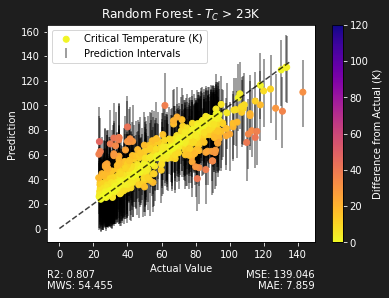

Starting training on Extra Trees - $T_C$ > 23K
('Extra Trees - $T_C$ > 23K', 116.775, 6.898, 52.537, 0.838, 51.414)


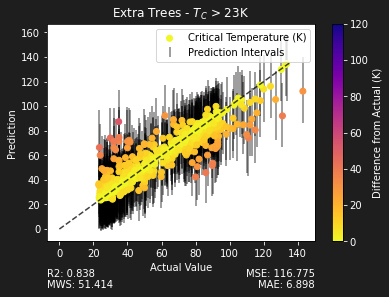

<Figure size 432x288 with 0 Axes>

In [6]:
sfn.import_data(replace_inf=True, split=False)
sfn.data = sfn.data[sfn.data.Tc > cutoff]
sfn.target = sfn.data.pop('Tc') #remove target (critical temp) from data
sfn.train_data, sfn.test_data, sfn.train_target, sfn.test_target = train_test_split(sfn.data, sfn.target, test_size=0.15, random_state=43, shuffle=True)

sfn.evaluate_one(f"Random Forest - $T_C$ > {cutoff}K", RandomForestRegressor, {'max_features': 'auto', 'n_estimators': 300}, uncertainty=True, method="plus", image=True)
sfn.evaluate_one(f"Extra Trees - $T_C$ > {cutoff}K", ExtraTreesRegressor, {'n_estimators': 589, 'n_jobs':-1}, uncertainty=True, method="plus", image=True)

Starting training on Random Forest - $T_C$ < 23K (Hamidieh 2018)
('Random Forest - $T_C$ < 23K (Hamidieh 2018)', 8.328, 1.74, 18.351, 0.774, 13.559)


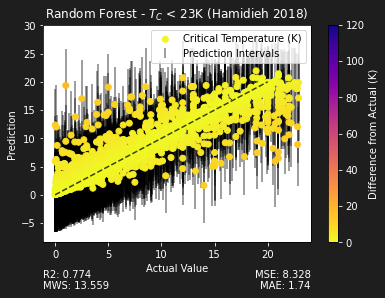

Starting training on Extra Trees - $T_C$ < 23K (Hamidieh 2018)
('Extra Trees - $T_C$ < 23K (Hamidieh 2018)', 8.522, 1.664, 18.976, 0.769, 13.567)


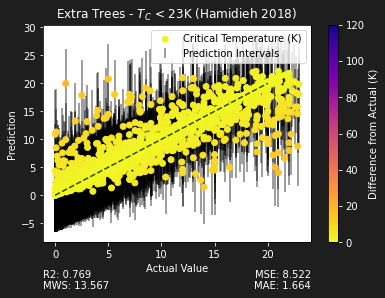

<Figure size 432x288 with 0 Axes>

In [13]:
sfn.import_data(replace_inf=True, split=False, filename="features_hamidieh.csv")
sfn.data = sfn.data[sfn.data.Tc < cutoff]
sfn.target = sfn.data.pop('Tc') #remove target (critical temp) from data
sfn.train_data, sfn.test_data, sfn.train_target, sfn.test_target = train_test_split(sfn.data, sfn.target, test_size=0.15, random_state=43, shuffle=True)

sfn.evaluate_one(f"Random Forest - $T_C$ < {cutoff}K (Hamidieh 2018)", RandomForestRegressor, {'max_features': 'auto', 'n_estimators': 300}, uncertainty=True, method="plus", maxexpected=20, image=True)
sfn.evaluate_one(f"Extra Trees - $T_C$ < {cutoff}K (Hamidieh 2018)", ExtraTreesRegressor, {'n_estimators': 589, 'n_jobs':-1}, uncertainty=True, method="plus", maxexpected=20, image=True)

Starting training on Random Forest - $T_C$ > 23K (Hamidieh 2018)
('Random Forest - $T_C$ > 23K (Hamidieh 2018)', 146.765, 8.262, 51.218, 0.808, 54.339)


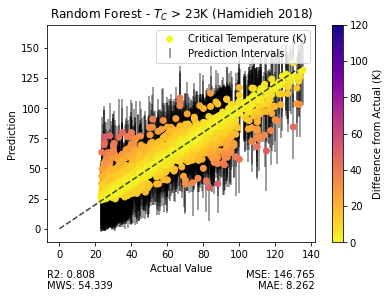

Starting training on Extra Trees - $T_C$ > 23K (Hamidieh 2018)
('Extra Trees - $T_C$ > 23K (Hamidieh 2018)', 140.736, 8.011, 56.6, 0.816, 53.441)


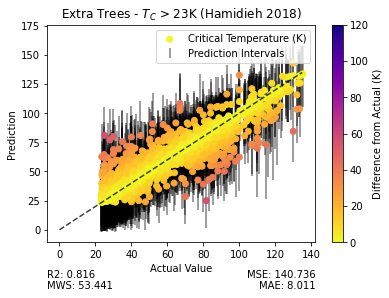

<Figure size 432x288 with 0 Axes>

In [14]:
sfn.import_data(replace_inf=True, split=False, filename="features_hamidieh.csv")
sfn.data = sfn.data[sfn.data.Tc > cutoff]
sfn.target = sfn.data.pop('Tc') #remove target (critical temp) from data
sfn.train_data, sfn.test_data, sfn.train_target, sfn.test_target = train_test_split(sfn.data, sfn.target, test_size=0.15, random_state=43, shuffle=True)

sfn.evaluate_one(f"Random Forest - $T_C$ > {cutoff}K (Hamidieh 2018)", RandomForestRegressor, {'max_features': 'auto', 'n_estimators': 300}, uncertainty=True, method="plus", image=True,background=False)
sfn.evaluate_one(f"Extra Trees - $T_C$ > {cutoff}K (Hamidieh 2018)", ExtraTreesRegressor, {'n_estimators': 589, 'n_jobs':-1}, uncertainty=True, method="plus", image=True,background=False)